## Project Name: Sustainable Future Forecasting: Socioeconomic & Environmental Analysis for Emissions Reduction

### Import all necessary libraries

In [1]:
import pandas as pd
import numpy as np
import warnings
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from statsmodels.tsa.seasonal import seasonal_decompose
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.linear_model import LinearRegression, Ridge
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, StackingRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.tree import plot_tree
from sklearn.model_selection import learning_curve

### Read the dataset into a dataframe 'df'

Dataset links are given below:

- The World Bank (n.d.). GDP growth (annual %). https://data.worldbank.org/indicator/NY.GDP.MKTP.KD.ZG
-  TheWorldBank(n.d.).GDPpercapitagrowth(annual%).https://data.worldbank.org/indicator/NY.GDP.PCAP.KD.ZG
- The World Bank (n.d.). CO2 emissions (kt). https://data.worldbank.org/indicator/EN.ATM.CO2E.KT
- TheWorldBank(n.d.).CO2emissions(metrictonspercapita).https://data.worldbank.org/indicator/EN.ATM.CO2E.PC
- TheWorldBank(n.d.).Accesstoelectricity(%ofpopulation).https://data.worldbank.org/indicator/EG.ELC.ACCS.ZS
- TheWorldBank(n.d.).Energyuse(kgofoilequivalentpercapita).https://data.worldbank.org/indicator/EG.USE.PCAP.KG.OE 
- The World Bank (n.d.). Population growth (annual %). https://data.worldbank.org/indicator/SP.POP.GROW

Merged Dataset CSV will be uploaded in DropBox submission

In [2]:
df = pd.read_csv("AAI Updated Dataset.csv")

## Data Preprocessing

### Display the dataframe

In [3]:
df

,Country Name,Country Code,Region,IncomeGroup,1990(E),1991(E),1992(E),1993(E),1994(E),1995(E),...,2013(Population annual growth),2014(Population annual growth),2015(Population annual growth),2016(Population annual growth),2017(Population annual growth),2018(Population annual growth),2019(Population annual growth),2020(Population annual growth),2021(Population annual growth),2022(Population annual growth)
0,Aruba,ABW,Latin America & Caribbean,High income,100.0,99.153656,99.197128,99.239914,100.000000,100.000000,...,0.749301,0.691615,0.637959,0.590062,0.537296,0.494795,0.451970,0.134255,-0.045045,-0.086392
1,Afghanistan,AFG,South Asia,Low income,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,...,3.466788,3.657576,3.121341,2.581549,2.866492,2.885208,2.908529,3.134747,2.851358,2.534498
2,Angola,AGO,Sub-Saharan Africa,Lower middle income,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,...,3.735525,3.684429,3.617678,3.586211,3.550987,3.464457,3.395278,3.268348,3.166030,3.096753
3,Albania,ALB,Europe & Central Asia,Upper middle income,100.0,100.000000,100.000000,100.000000,100.000000,100.000000,...,-0.183211,-0.207047,-0.291206,-0.159880,-0.091972,-0.246732,-0.426007,-0.574207,-0.926918,-1.215790
4,Andorra,AND,Europe & Central Asia,High income,100.0,100.000000,100.000000,100.000000,100.000000,100.000000,...,0.497262,0.355275,0.174378,1.100603,1.772183,1.580147,1.757491,1.761891,1.702288,0.994607
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
212,Kosovo,XKX,Europe & Central Asia,Upper middle income,100.0,100.000000,100.000000,100.000000,100.000000,100.000000,...,0.607468,-0.294474,-1.364932,-0.596734,0.753585,0.339011,-0.457730,0.070131,-0.229016,-1.355874
213,"Yemen, Rep.",YEM,Middle East & North Africa,Low income,0.0,0.000000,44.100000,40.774715,41.985134,43.193512,...,2.859237,2.811072,2.712955,2.621537,2.564321,2.486360,2.426208,2.310447,2.137790,2.144628
214,South Africa,ZAF,Sub-Saharan Africa,Upper middle income,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,...,1.361621,1.576294,2.074017,0.972004,0.387278,1.225530,1.295074,1.223179,0.998920,0.841058
215,Zambia,ZMB,Sub-Saharan Africa,Lower middle income,13.9,12.752703,19.200000,14.213207,14.941759,15.668272,...,3.271299,3.247118,3.191896,3.147407,3.113595,3.061888,3.007618,2.933818,2.840806,2.758032


### Print out all the features of df

In [4]:
print(list(df.columns))

['Country Name', 'Country Code', 'Region', 'IncomeGroup', '1990(E)', '1991(E)', '1992(E)', '1993(E)', '1994(E)', '1995(E)', '1996(E)', '1997(E)', '1998(E)', '1999(E)', '2000(E)', '2001(E)', '2002(E)', '2003(E)', '2004(E)', '2005(E)', '2006(E)', '2007(E)', '2008(E)', '2009(E)', '2010(E)', '2011(E)', '2012(E)', '2013(E)', '2014(E)', '2015(E)', '2016(E)', '2017(E)', '2018(E)', '2019(E)', '2020(E)', '2021(E)', '1960(EG)', '1961(EG)', '1962(EG)', '1963(EG)', '1964(EG)', '1965(EG)', '1966(EG)', '1967(EG)', '1968(EG)', '1969(EG)', '1970(EG)', '1971(EG)', '1972(EG)', '1973(EG)', '1974(EG)', '1975(EG)', '1976(EG)', '1977(EG)', '1978(EG)', '1979(EG)', '1980(EG)', '1981(EG)', '1982(EG)', '1983(EG)', '1984(EG)', '1985(EG)', '1986(EG)', '1987(EG)', '1988(EG)', '1989(EG)', '1990(EG)', '1991(EG)', '1992(EG)', '1993(EG)', '1994(EG)', '1995(EG)', '1996(EG)', '1997(EG)', '1998(EG)', '1999(EG)', '2000(EG)', '2001(EG)', '2002(EG)', '2003(EG)', '2004(EG)', '2005(EG)', '2006(EG)', '2007(EG)', '2008(EG)', '2

In [5]:
df.head()

,Country Name,Country Code,Region,IncomeGroup,1990(E),1991(E),1992(E),1993(E),1994(E),1995(E),...,2013(Population annual growth),2014(Population annual growth),2015(Population annual growth),2016(Population annual growth),2017(Population annual growth),2018(Population annual growth),2019(Population annual growth),2020(Population annual growth),2021(Population annual growth),2022(Population annual growth)
0,Aruba,ABW,Latin America & Caribbean,High income,100.0,99.153656,99.197128,99.239914,100.0,100.0,...,0.749301,0.691615,0.637959,0.590062,0.537296,0.494795,0.451970,0.134255,-0.045045,-0.086392
1,Afghanistan,AFG,South Asia,Low income,0.0,0.000000,0.000000,0.000000,0.0,0.0,...,3.466788,3.657576,3.121341,2.581549,2.866492,2.885208,2.908529,3.134747,2.851358,2.534498
2,Angola,AGO,Sub-Saharan Africa,Lower middle income,0.0,0.000000,0.000000,0.000000,0.0,0.0,...,3.735525,3.684429,3.617678,3.586211,3.550987,3.464457,3.395278,3.268348,3.166030,3.096753
3,Albania,ALB,Europe & Central Asia,Upper middle income,100.0,100.000000,100.000000,100.000000,100.0,100.0,...,-0.183211,-0.207047,-0.291206,-0.159880,-0.091972,-0.246732,-0.426007,-0.574207,-0.926918,-1.215790
4,Andorra,AND,Europe & Central Asia,High income,100.0,100.000000,100.000000,100.000000,100.0,100.0,...,0.497262,0.355275,0.174378,1.100603,1.772183,1.580147,1.757491,1.761891,1.702288,0.994607


### Check the dimensions of the dataset

In [6]:
print("Dataset dimensions:", df.shape)

Dataset dimensions: (217, 309)


### Check the data types of each column

In [7]:
print("\nData types:\n", df.dtypes)


Data types:
 Country Name                       object
Country Code                       object
Region                             object
IncomeGroup                        object
1990(E)                           float64
                                   ...   
2018(Population annual growth)    float64
2019(Population annual growth)    float64
2020(Population annual growth)    float64
2021(Population annual growth)    float64
2022(Population annual growth)    float64
Length: 309, dtype: object


### Check for missing values

In [8]:
print("\nMissing values:\n", df.isnull().sum())


Missing values:
 Country Name                      0
Country Code                      0
Region                            0
IncomeGroup                       0
1990(E)                           0
                                 ..
2018(Population annual growth)    0
2019(Population annual growth)    0
2020(Population annual growth)    0
2021(Population annual growth)    0
2022(Population annual growth)    0
Length: 309, dtype: int64


### Summary statistics for numerical variables

In [9]:
df.describe().style.background_gradient(cmap="twilight_shifted")

### Extracting relevant columns related to CO2 emissions & GDP per capita from the DataFrame

In [10]:
# Extracting columns related to CO2 emissions from the DataFrame
co2_cols = [col for col in df.columns if 'CO2' in col]

# Extracting columns related to GDP per capita from the DataFrame
gdp_per_capita_cols = [col for col in df.columns if 'GDP per capita' in col]

### Display the extracted columns

In [11]:
print(co2_cols)
print(gdp_per_capita_cols)

['1990(CO2)', '1991(CO2)', '1992(CO2)', '1993(CO2)', '1994(CO2)', '1995(CO2)', '1996(CO2)', '1997(CO2)', '1998(CO2)', '1999(CO2)', '2000(CO2)', '2001(CO2)', '2002(CO2)', '2003(CO2)', '2004(CO2)', '2005(CO2)', '2006(CO2)', '2007(CO2)', '2008(CO2)', '2009(CO2)', '2010(CO2)', '2011(CO2)', '2012(CO2)', '2013(CO2)', '2014(CO2)', '2015(CO2)', '2016(CO2)', '2017(CO2)', '2018(CO2)', '2019(CO2)', '2020(CO2)']
['1961(GDP per capita annual growth)', '1962(GDP per capita annual growth)', '1963(GDP per capita annual growth)', '1964(GDP per capita annual growth)', '1965(GDP per capita annual growth)', '1966(GDP per capita annual growth)', '1967(GDP per capita annual growth)', '1968(GDP per capita annual growth)', '1969(GDP per capita annual growth)', '1970(GDP per capita annual growth)', '1971(GDP per capita annual growth)', '1972(GDP per capita annual growth)', '1973(GDP per capita annual growth)', '1974(GDP per capita annual growth)', '1975(GDP per capita annual growth)', '1976(GDP per capita annu

## Exploratory Data Analysis (EDA)

### Visualization 01: CO2 emissions over time using line plot

In [12]:
# Create a figure
fig = go.Figure()

# Add traces for each column in co2_cols
for col in co2_cols:
    fig.add_trace(go.Scatter(x=df.columns[4:], y=df[col], mode='lines', name=col))

# Update layout
fig.update_layout(
    title='CO2 Emissions Over Time',
    xaxis_title='Year',
    yaxis_title='CO2 emissions (kt)',
    hovermode='x',  # Display closest data point on hover
    height=600,     # Adjust height for better visibility
    width=1000      # Adjust width for better visibility
)

# Show plot
fig.show()

### Visualization 02: Top 10 Countries by GDP per Capita in 2022 using Bar Plot

In [13]:
# Extracting the latest year from the column names
gdp_per_capita_columns = [col for col in df.columns if 'GDP per capita' in col]
latest_year = max(gdp_per_capita_columns, key=lambda x: int(x.split('(')[0]))

# Creating the 'latest_gdp_per_capita' column if it exists
if latest_year in df.columns:
    df['latest_gdp_per_capita'] = df[latest_year].apply(lambda x: round(x, 3))  # Round to two decimal places
else:
    print(f"The column {latest_year} does not exist.")

# Creating a bar plot using Plotly
fig = px.bar(df.nlargest(10, 'latest_gdp_per_capita'),
             x='Country Name',
             y='latest_gdp_per_capita',
             labels={'Country Name': 'Country', 'latest_gdp_per_capita': 'GDP per capita'},
             title=f'Top 10 Countries by GDP per Capita in {latest_year.split("(")[0]}',
             text='latest_gdp_per_capita')

# Customizing layout
fig.update_layout(xaxis_tickangle=-45,  # Rotate x-axis labels for better readability
                  xaxis_title='Country',
                  yaxis_title='GDP per capita',
                  height=600,  # Adjust height for better visibility
                  width=1000)  # Adjust width for better visibility

# Showing the plot
fig.show()

### Visualization 03: Top 10 Countries by CO2 Emissions in 2020

In [14]:
# Extracting the latest year from the column names
co2_columns = [col for col in df.columns if 'CO2' in col]
latest_year = max(co2_columns, key=lambda x: int(x.split('(')[0]))

# Creating the 'latest_co2' column if it exists
if latest_year in df.columns:
    df['latest_co2'] = df[latest_year].apply(lambda x: round(x, 2))  # Round to two decimal places
else:
    print(f"The column {latest_year} does not exist.")

# Creating a bar plot using Plotly
fig = px.bar(df.nlargest(10, 'latest_co2'),
             x='Country Name',
             y='latest_co2',
             labels={'Country Name': 'Country', 'latest_co2': 'CO2 Emissions'},
             title=f'Top 10 Countries by CO2 Emissions in {latest_year.split("(")[0]}',
             text='latest_co2')

# Customizing layout
fig.update_layout(xaxis_tickangle=-45,  # Rotate x-axis labels for better readability
                  xaxis_title='Country',
                  yaxis_title='CO2 Emissions',
                  height=600,  # Adjust height for better visibility
                  width=1000)  # Adjust width for better visibility

# Showing the plot
fig.show()

### Visualization 04: CO2 Emissions vs GDP per Capita Annual Growth in 2022 using Scatter Plot

In [1]:
# Specify the latest year
latest_year = '2020'

# Create scatter plot using Plotly Express
fig = px.scatter(df, x=f'{latest_year}(GDP per capita annual growth)', y=f'{latest_year}(CO2)', 
                 labels={f'{latest_year}(GDP per capita annual growth)': f'GDP per capita annual growth in {latest_year}',
                         f'{latest_year}(CO2)': f'CO2 emissions in {latest_year}'},
                 title=f'CO2 Emissions vs GDP per Capita Annual Growth in 2022{latest_year}')

# Customize layout
fig.update_layout(xaxis_title=f'GDP per capita annual growth in {latest_year}',
                  yaxis_title=f'CO2 emissions in {latest_year}',
                  height=600,
                  width=1000)

# Show the plot
fig.show()

NameError: name 'px' is not defined

### Visualization 05: CO2 Emissions by Region (2020) using Stacked Bar Chart

In [16]:
# Assuming df is your DataFrame containing CO2 emissions and region information
# Group by region and sum CO2 emissions
df_region_co2 = df.groupby('Region')['2020(CO2)'].sum().reset_index()

# Get list of regions and corresponding CO2 emissions
regions = df_region_co2['Region']
co2_emissions = df_region_co2['2020(CO2)']

# Create a list to hold the data for each region
data = []

# Extract CO2 emissions for each region
for region in regions:
    region_co2 = df[df['Region'] == region]['2020(CO2)'].sum()
    data.append(region_co2)

# Create the stacked bar chart
fig = go.Figure(data=[go.Bar(x=regions, y=data)])

# Update layout
fig.update_layout(
    barmode='stack',
    title='CO2 Emissions by Region (2020)',
    xaxis_title='Region',
    yaxis_title='CO2 Emissions (metric tons)'
)

# Show the plot
fig.show()

### Visualization 06: Area Plot of the Countries

In [17]:
# Sample DataFrame with hypothetical data
data = {
    'Country Name': ['Bangladesh', 'United States', 'Canada', 'Australia'],
    'Region': ['South Asia', 'North America', 'North America', 'East Asia & Pacific'],
    'IncomeGroup': ['Lower middle income', 'High income', 'High income', 'High income'],
    '2022(Population annual growth)': [2.0, 1.5, 0.9, 0.5]
}

# Selecting the columns for plotting
columns_to_plot = ['Country Name', 'Region', 'IncomeGroup']

# Plotting the area plot using Plotly
fig = go.Figure()

for index, row in df.iterrows():
    fig.add_trace(go.Scatter(x=columns_to_plot, y=row[columns_to_plot], mode='lines+markers', name=row['Country Name']))

fig.update_layout(
    title='Area Plot of Hypothetical Data',
    xaxis_title='Category',
    yaxis_title='Value',
    xaxis=dict(tickangle=-45),
    legend=dict(x=0, y=1.0),
    margin=dict(l=50, r=50, t=50, b=50),
    height=800,  # Increase the height
    width=1000    # Increase the width
)

fig.show()

### Visualization 07: Scatter Plot Matrix of Selected Features (2015)

In [18]:
# Suppress FutureWarning about iteritems
warnings.filterwarnings("ignore", category=FutureWarning)

# Assuming df is your DataFrame and features_list contains the selected features
selected_features = ['2015(E)', '2015(EG)', '2015(CO2)', '2015(GDP annual growth)', '2015(GDP per capita annual growth)', '2015(Population annual growth)']

# Select the subset of features from the DataFrame
df_selected = df[selected_features]

# Assign unique colors to each data point
num_samples = len(df_selected)
colors = np.linspace(0, 1, num_samples)

# Create the scatter plot matrix using Plotly Express
scatter_matrix = px.scatter_matrix(df_selected, color=colors, title='Scatter Plot Matrix of Selected Features (2020)', height=2000, width=2000)

# Show the plot
scatter_matrix.show()

### Visualization 08: 3D Plot visualization of the dataset

In [19]:
feature1 = df['Country Name']
feature2 = df['Region']
feature3 = df['IncomeGroup']

# Define a colormap to map each region to a color
colormap = {
    'South Asia': 'rgb(255, 0, 0)',  # Red
    'North America': 'rgb(0, 0, 255)',  # Blue
    'East Asia & Pacific': 'rgb(0, 255, 0)',  # Green
    'Europe & Central Asia': 'rgb(255, 255, 0)',  # Yellow
    'Sub-Saharan Africa': 'rgb(255, 0, 255)',  # Magenta
    'Latin America & Caribbean': 'rgb(0, 255, 255)',  # Cyan
    'Middle East & North Africa': 'rgb(128, 0, 128)',  # Purple
    # Add more regions and colors as needed
}

# Create a list of colors corresponding to each region
colors = [colormap[region] for region in feature2]

# Create 3D scatter plot
fig = go.Figure(data=[go.Scatter3d(
    x=feature1,
    y=feature2,
    z=feature3,
    text=df['Country Name'],
    mode='markers',
    marker=dict(
        size=8,
        color=colors,  # Use the colors list
        opacity=0.8
    )
)])

# Update layout for better visualization
fig.update_layout(
    scene=dict(
        xaxis_title='Country Name',
        yaxis_title='Region',
        zaxis_title='IncomeGroup'
    ),
    title='3D Plot of Your Dataset',
    margin=dict(l=0, r=0, b=0, t=40),
    height=600,
    width=800
)

# Show interactive plot
fig.show()

### Visualization 09: STL Decomposition of CO2 over the years

In [20]:
years = range(1990, 2022)  

# Create a DataFrame containing only CO2 emissions data
co2_columns = [col for col in df.columns if 'CO2' in col]
co2_emissions_df = df[co2_columns]

# Set the index to a datetime index with yearly frequency
co2_emissions_df.index = pd.date_range(start=f'{years[0]}-01-01', periods=len(co2_emissions_df), freq='Y')

# Perform STL decomposition for each CO2 feature and create interactive plots
for column in co2_emissions_df.columns:
    decomposition = seasonal_decompose(co2_emissions_df[column], model='additive')
    
    # Create traces for each component
    traces = [
        go.Scatter(x=co2_emissions_df.index, y=co2_emissions_df[column], mode='lines', name='Original'),
        go.Scatter(x=co2_emissions_df.index, y=decomposition.trend, mode='lines', name='Trend'),
        go.Scatter(x=co2_emissions_df.index, y=decomposition.seasonal, mode='lines', name='Seasonal'),
        go.Scatter(x=co2_emissions_df.index, y=decomposition.resid, mode='lines', name='Residual')
    ]
    
    # Create layout for the plot
    layout = dict(title=f'STL Decomposition of {column}', xaxis=dict(title='Year'), yaxis=dict(title='CO2 Emissions'))
    
    # Create figure and plot
    fig = go.Figure(data=traces, layout=layout)
    fig.show()

### Visualization 10: CO2 Emissions Over the Years using scatterplot

In [21]:
# Filter columns to select only CO2 emission columns
co2_columns = [col for col in df.columns if 'CO2' in col]

# Create a new DataFrame with only the CO2 emission columns
df_co2 = df[co2_columns]

# If the CO2 emissions are in separate columns for each year, you can aggregate them
# For example, if you have columns like 'CO2_2018', 'CO2_2019', 'CO2_2020', etc.
# You can sum them up to get the total emissions for each year
df_co2_yearly = df_co2.sum(axis=0)

# Create a Plotly line plot for CO2 emissions over the years
fig = go.Figure()
fig.add_trace(go.Scatter(x=df_co2_yearly.index, y=df_co2_yearly.values, mode='lines+markers', name='CO2 Emissions'))
fig.update_layout(title='CO2 Emissions Over the Years',
                  xaxis_title='Year',
                  yaxis_title='CO2 Emissions',
                  template='ggplot2')  # Set dark theme for the plot

# Show the plot
fig.show()

### Visualization 11: GDP per Capita Over Time

In [22]:
# Assuming df is your DataFrame and 'GDP per capita' is one of the features
gdp_per_capita_columns = [col for col in df.columns if 'GDP per capita' in col]
gdp_per_capita_df = df[gdp_per_capita_columns]

# Plot GDP per capita using Plotly Express
fig = px.line(gdp_per_capita_df, title='GDP per Capita Over Time')
fig.update_layout(xaxis_title='Year', yaxis_title='GDP per Capita')
fig.show()

### Visualization 12: CO2 Emissions Worldwide using Choropleth

In [23]:
# Reshape the DataFrame to have CO2 emissions year-wise for each country
co2_columns = [col for col in df.columns if 'CO2' in col]
co2_df = df[['Country Code', 'Country Name'] + co2_columns]
co2_df = co2_df.melt(id_vars=['Country Code', 'Country Name'], var_name='Year', value_name='CO2 emissions')
co2_df['Year'] = co2_df['Year'].str.extract('(\d+)').astype(int)

# Plot CO2 emissions on a world map
fig = px.choropleth(co2_df, 
                    locations='Country Code', 
                    color='CO2 emissions',
                    hover_name='Country Name',
                    animation_frame='Year',
                    color_continuous_scale='Viridis',  # You can change the color scale
                    title='CO2 Emissions Worldwide')
fig.update_layout(coloraxis_colorbar=dict(title='CO2 Emissions (metric tons)'))
fig.show()

### Visualization 13: PCA Cluster Analysis & t-SNE Cluster Analysis

In [24]:
# Select the features for analysis
features = [
    '2015(E)',
    '2015(EG)',
    '2015(CO2)',
    '2015(GDP annual growth)',
    '2015(GDP per capita annual growth)',
    '2015(Population annual growth)',
]

# Standardize the features
scaler = StandardScaler()
scaled_features = scaler.fit_transform(df[features])

# Apply PCA for dimensionality reduction
pca = PCA(n_components=2)
pca_result = pca.fit_transform(scaled_features)

# Apply t-SNE for dimensionality reduction
tsne = TSNE(n_components=2, random_state=42)
tsne_result = tsne.fit_transform(scaled_features)

# Apply KMeans clustering
kmeans = KMeans(n_clusters=3, random_state=42)
kmeans.fit(scaled_features)
clusters = kmeans.predict(scaled_features)

# Create DataFrame for visualization
visualization_df = pd.DataFrame({
    'PCA1': pca_result[:, 0],
    'PCA2': pca_result[:, 1],
    't-SNE1': tsne_result[:, 0],
    't-SNE2': tsne_result[:, 1],
    'Cluster': clusters
})

# Plot interactive visualization
fig = px.scatter(visualization_df, x='PCA1', y='PCA2', color='Cluster', 
                 hover_data=[visualization_df.index], title='PCA Cluster Analysis')
fig.update_traces(marker=dict(size=8))
fig.show()

fig = px.scatter(visualization_df, x='t-SNE1', y='t-SNE2', color='Cluster', 
                 hover_data=[visualization_df.index], title='t-SNE Cluster Analysis')
fig.update_traces(marker=dict(size=8))
fig.show()

### Visualization 14: Correlation Matrix of All the Numerical Features

In [25]:
# Adjust the DataFrame to include only numeric columns
df_numeric = df.select_dtypes(include=['float64', 'int64'])

# Impute missing values with the mean
df_numeric = df_numeric.fillna(df_numeric.mean())

# Compute the correlation matrix for the numeric DataFrame
corr_matrix_numeric = df_numeric.corr()

# Create a heatmap figure using Plotly
fig = go.Figure(data=go.Heatmap(
                   z=corr_matrix_numeric.values,
                   x=corr_matrix_numeric.columns,
                   y=corr_matrix_numeric.columns,
                   colorscale='RdBu',
                   zmin=-1,
                   zmax=1,
                   colorbar=dict(
                       title='Correlation',
                       tickvals=[-1, -0.5, 0, 0.5, 1],
                       ticktext=['-1', '-0.5', '0', '0.5', '1'],
                       ticks='outside',
                       dtick=0.5
                   )
               ))

# Customize layout
fig.update_layout(
    title='Correlation Matrix',
    xaxis_title='Features',
    yaxis_title='Features',
    width=1000,
    height=1000
)

# Show the plot
fig.show()

### Checking for discrepancies between DataFrame columns & correlation matrix columns/index

In [26]:
columns_match = (corr_matrix_numeric.columns == df_numeric.columns).all()
index_match = (corr_matrix_numeric.index == df_numeric.columns).all()

print("\nColumns Match:", columns_match)
print("Index Match:", index_match)


Columns Match: True
Index Match: True


In [27]:
# Print the values of corr_matrix.columns and corr_matrix.index
print("\nColumns of Correlation Matrix:")
print(corr_matrix_numeric.columns)


Columns of Correlation Matrix:
Index(['1990(E)', '1991(E)', '1992(E)', '1993(E)', '1994(E)', '1995(E)',
       '1996(E)', '1997(E)', '1998(E)', '1999(E)',
       ...
       '2015(Population annual growth)', '2016(Population annual growth)',
       '2017(Population annual growth)', '2018(Population annual growth)',
       '2019(Population annual growth)', '2020(Population annual growth)',
       '2021(Population annual growth)', '2022(Population annual growth)',
       'latest_gdp_per_capita', 'latest_co2'],
      dtype='object', length=307)


In [28]:
print("\nIndex of Correlation Matrix:")
print(corr_matrix_numeric.index)


Index of Correlation Matrix:
Index(['1990(E)', '1991(E)', '1992(E)', '1993(E)', '1994(E)', '1995(E)',
       '1996(E)', '1997(E)', '1998(E)', '1999(E)',
       ...
       '2015(Population annual growth)', '2016(Population annual growth)',
       '2017(Population annual growth)', '2018(Population annual growth)',
       '2019(Population annual growth)', '2020(Population annual growth)',
       '2021(Population annual growth)', '2022(Population annual growth)',
       'latest_gdp_per_capita', 'latest_co2'],
      dtype='object', length=307)


## Outlier Detection

### Visualization 15: Boxplot visualization 'Electricity Usage' in 2015

In [29]:
# Create a boxplot using Plotly Graph Objects
fig = go.Figure()

# Add box trace for the '2015(E)' feature
feature = '2015(E)'
fig.add_trace(go.Box(
    y=df[feature],
    name=feature,
    boxmean=True,  # Show mean in the box
    boxpoints='outliers',  # Display outliers
    jitter=0.3,  # Spread out points for better visibility
    marker=dict(
        color='rgb(107,174,214)',  # Custom marker color
        outliercolor='rgba(219, 64, 82, 0.6)',  # Color for outliers
        line=dict(
            outliercolor='rgba(219, 64, 82, 0.6)',  # Outlier line color
            outlierwidth=2  # Outlier line width
        )
    ),
    hoverinfo='y'  # Show y-value on hover
))

# Customize layout
fig.update_layout(
    title='Boxplot of Selected Features',
    xaxis_title='Feature',
    yaxis_title='Value',
    showlegend=False,  # Hide legend initially
    height=1000,  # Set height of the plot (increased from 600)
    width=1000,  # Set width of the plot
)

# Add interactive features
fig.update_traces(
    hovertemplate='%{y:.2f}',  # Format hover text to two decimal places
    hoverlabel=dict(bgcolor='white', font_size=12),  # Style hover label
    boxmean=True  # Show mean in the box
)

# Show the plot
fig.show()

### Visualization 16: Highlighted Outliers of 'Electricity' in 2015

In [30]:
feature = '2015(E)'

# Define the outlier detection method
q1 = df[feature].quantile(0.25)
q3 = df[feature].quantile(0.75)
iqr = q3 - q1
lower_bound = (q1 - (1.5 * iqr))
upper_bound = (q3 + (1.5 * iqr))
outliers = df[(df[feature] < lower_bound) | (df[feature] > upper_bound)][feature]

# Create a box plot with outliers highlighted
fig = px.box(df, y=feature, title=f'Boxplot of {feature} with Outliers Highlighted', labels={'value': 'Value', 'variable': 'Feature'})
fig.update_traces(marker=dict(color='red'), boxmean=True)  # Customize marker color and display mean in the box
fig.add_scatter(x=outliers.index, y=outliers, mode='markers', marker=dict(color='red'), name='Outliers')  # Add outliers
fig.show()

# Print number of outliers
print(f"Number of outliers for {feature}: {outliers.shape[0]}")

Number of outliers for 2015(E): 23


### Visualization 17: Boxplot visualization Energy Usage in 2015

In [31]:
# Create a boxplot using Plotly Graph Objects
fig = go.Figure()

# Add box trace for the '2015(EG)' feature
feature = '2015(EG)'
fig.add_trace(go.Box(
    y=df[feature],
    name=feature,
    boxmean=True,  # Show mean in the box
    boxpoints='outliers',  # Display outliers
    jitter=0.3,  # Spread out points for better visibility
    marker=dict(
        color='rgb(107,174,214)',  # Custom marker color
        outliercolor='rgba(219, 64, 82, 0.6)',  # Color for outliers
        line=dict(
            outliercolor='rgba(219, 64, 82, 0.6)',  # Outlier line color
            outlierwidth=2  # Outlier line width
        )
    ),
    hoverinfo='y'  # Show y-value on hover
))

# Customize layout
fig.update_layout(
    title='Boxplot of Selected Features',
    xaxis_title='Feature',
    yaxis_title='Value',
    showlegend=False,  # Hide legend initially
    height=1500,  # Set height of the plot (increased from 600)
    width=1000,  # Set width of the plot
)

# Add interactive features
fig.update_traces(
    hovertemplate='%{y:.2f}',  # Format hover text to two decimal places
    hoverlabel=dict(bgcolor='white', font_size=12),  # Style hover label
    boxmean=True  # Show mean in the box
)

# Show the plot
fig.show()

### Visualization 18: Highlighted Outliers of Energy Usage in 2015

In [32]:
# Select the feature of interest
feature = '2015(EG)'

# Define the outlier detection method
q1 = df[feature].quantile(0.25)
q3 = df[feature].quantile(0.75)
iqr = q3 - q1
lower_bound = (q1 - (1.5 * iqr))
upper_bound = (q3 + (1.5 * iqr))
outliers = df[(df[feature] < lower_bound) | (df[feature] > upper_bound)][feature]

# Create a box plot with outliers highlighted
fig = px.box(df, y=feature, title=f'Boxplot of {feature} with Outliers Highlighted', labels={'value': 'Value', 'variable': 'Feature'})
fig.update_traces(marker=dict(color='red'), boxmean=True)  # Customize marker color and display mean in the box
fig.add_scatter(x=outliers.index, y=outliers, mode='markers', marker=dict(color='red'), name='Outliers')  # Add outliers
fig.show()

# Print number of outliers
print(f"Number of outliers for {feature}: {outliers.shape[0]}")

Number of outliers for 2015(EG): 34


### Visualization 19: Boxplot visualization CO2 Emission in 2015

In [33]:
# Create a boxplot using Plotly Graph Objects
fig = go.Figure()

# Add box trace for the '2015(CO2)' feature
feature = '2015(CO2)'
fig.add_trace(go.Box(
    y=df[feature],
    name=feature,
    boxmean=True,  # Show mean in the box
    boxpoints='outliers',  # Display outliers
    jitter=0.3,  # Spread out points for better visibility
    marker=dict(
        color='rgb(107,174,214)',  # Custom marker color
        outliercolor='rgba(219, 64, 82, 0.6)',  # Color for outliers
        line=dict(
            outliercolor='rgba(219, 64, 82, 0.6)',  # Outlier line color
            outlierwidth=2  # Outlier line width
        )
    ),
    hoverinfo='y'  # Show y-value on hover
))

# Customize layout
fig.update_layout(
    title='Boxplot of Selected Features',
    xaxis_title='Feature',
    yaxis_title='Value',
    showlegend=False,  # Hide legend initially
    height=1000,  # Set height of the plot (increased from 600)
    width=1000,  # Set width of the plot
)

# Add interactive features
fig.update_traces(
    hovertemplate='%{y:.2f}',  # Format hover text to two decimal places
    hoverlabel=dict(bgcolor='white', font_size=12),  # Style hover label
    boxmean=True  # Show mean in the box
)

# Show the plot
fig.show()

### Visualization 20: Highlighted Outliers of CO2 Emission in 2015

In [34]:
feature = '2015(CO2)'

# Define the outlier detection method
q1 = df[feature].quantile(0.25)
q3 = df[feature].quantile(0.75)
iqr = q3 - q1
lower_bound = (q1 - (1.5 * iqr))
upper_bound = (q3 + (1.5 * iqr))
outliers = df[(df[feature] < lower_bound) | (df[feature] > upper_bound)][feature]

# Create a box plot with outliers highlighted
fig = px.box(df, y=feature, title=f'Boxplot of {feature} with Outliers Highlighted', labels={'value': 'Value', 'variable': 'Feature'})
fig.update_traces(marker=dict(color='red'), boxmean=True)  # Customize marker color and display mean in the box
fig.add_scatter(x=outliers.index, y=outliers, mode='markers', marker=dict(color='red'), name='Outliers')  # Add outliers
fig.show()

# Print number of outliers
print(f"Number of outliers for {feature}: {outliers.shape[0]}")

Number of outliers for 2015(CO2): 34


### Visualization 21: Boxplot visualization GDP Annual, GDP Per Capita & Population Growth in 2015

In [35]:
# Define the list of features
best_features_for_boxplot = [
    '2015(GDP annual growth)',
    '2015(GDP per capita annual growth)',
    '2015(Population annual growth)'
]

# Create a boxplot using Plotly Graph Objects
fig = go.Figure()

# Add box traces for each feature
for feature in best_features_for_boxplot:
    fig.add_trace(go.Box(
        y=df[feature],
        name=feature,
        boxmean=True,  # Show mean in the box
        boxpoints='outliers',  # Display outliers
        jitter=0.3,  # Spread out points for better visibility
        marker=dict(
            color='rgb(107,174,214)',  # Custom marker color
            outliercolor='rgba(219, 64, 82, 0.6)',  # Color for outliers
            line=dict(
                outliercolor='rgba(219, 64, 82, 0.6)',  # Outlier line color
                outlierwidth=2  # Outlier line width
            )
        ),
        hoverinfo='y+name'  # Show y-value and feature name on hover
    ))

# Customize layout
fig.update_layout(
    title='Boxplot of Selected Features',
    xaxis_title='Feature',
    yaxis_title='Value',
    boxmode='group',  # Group box traces
    showlegend=False,  # Hide legend initially
    height=1000,  # Set height of the plot (increased from 600)
    width=1000  # Set width of the plot
)

# Add interactive features
fig.update_traces(
    hovertemplate='%{y:.2f}',  # Format hover text to two decimal places
    hoverlabel=dict(bgcolor='white', font_size=12),  # Style hover label
    boxmean=True  # Show mean in the box
)

# Show the plot
fig.show()

### Visualization 22: Highlighted Outliers of GDP Annual Growth in 2015

In [36]:
feature = '2015(GDP annual growth)'

# Define the outlier detection method
q1 = df[feature].quantile(0.25)
q3 = df[feature].quantile(0.75)
iqr = q3 - q1
lower_bound = (q1 - (1.5 * iqr))
upper_bound = (q3 + (1.5 * iqr))
outliers = df[(df[feature] < lower_bound) | (df[feature] > upper_bound)][feature]

# Create a box plot with outliers highlighted
fig = px.box(df, y=feature, title=f'Boxplot of {feature} with Outliers Highlighted', labels={'value': 'Value', 'variable': 'Feature'})
fig.update_traces(marker=dict(color='red'), boxmean=True)  # Customize marker color and display mean in the box
fig.add_scatter(x=outliers.index, y=outliers, mode='markers', marker=dict(color='red'), name='Outliers')  # Add outliers
fig.show()

# Print number of outliers
print(f"Number of outliers for {feature}: {outliers.shape[0]}")

Number of outliers for 2015(GDP annual growth): 14


### Visualization 23: Highlighted Outliers of GDP Per Capita Annual Growth in 2015

In [37]:
feature = '2015(GDP per capita annual growth)'

# Define the outlier detection method
q1 = df[feature].quantile(0.25)
q3 = df[feature].quantile(0.75)
iqr = q3 - q1
lower_bound = (q1 - (1.5 * iqr))
upper_bound = (q3 + (1.5 * iqr))
outliers = df[(df[feature] < lower_bound) | (df[feature] > upper_bound)][feature]

# Create a box plot with outliers highlighted
fig = px.box(df, y=feature, title=f'Boxplot of {feature} with Outliers Highlighted', labels={'value': 'Value', 'variable': 'Feature'})
fig.update_traces(marker=dict(color='red'), boxmean=True)  # Customize marker color and display mean in the box
fig.add_scatter(x=outliers.index, y=outliers, mode='markers', marker=dict(color='red'), name='Outliers')  # Add outliers
fig.show()

# Print number of outliers
print(f"Number of outliers for {feature}: {outliers.shape[0]}")

Number of outliers for 2015(GDP per capita annual growth): 12


### Visualization 24: Highlighted Outliers of Population Annual Growth in 2015

In [38]:
feature = '2015(Population annual growth)'

# Define the outlier detection method
q1 = df[feature].quantile(0.25)
q3 = df[feature].quantile(0.75)
iqr = q3 - q1
lower_bound = (q1 - (1.5 * iqr))
upper_bound = (q3 + (1.5 * iqr))
outliers = df[(df[feature] < lower_bound) | (df[feature] > upper_bound)][feature]

# Create a box plot with outliers highlighted
fig = px.box(df, y=feature, title=f'Boxplot of {feature} with Outliers Highlighted', labels={'value': 'Value', 'variable': 'Feature'})
fig.update_traces(marker=dict(color='red'), boxmean=True)  # Customize marker color and display mean in the box
fig.add_scatter(x=outliers.index, y=outliers, mode='markers', marker=dict(color='red'), name='Outliers')  # Add outliers
fig.show()

# Print number of outliers
print(f"Number of outliers for {feature}: {outliers.shape[0]}")

Number of outliers for 2015(Population annual growth): 3


## Outlier Removal Process

In [39]:
# Define features for outlier removal by year
features_by_year = {
    '1990': ['1990(E)', '1990(EG)', '1990(CO2)', '1990(GDP annual growth)', '1990(GDP per capita annual growth)', '1990(Population annual growth)'],
    '1991': ['1991(E)', '1991(EG)', '1991(CO2)', '1991(GDP annual growth)', '1991(GDP per capita annual growth)', '1991(Population annual growth)'],
    '1992': ['1992(E)', '1992(EG)', '1992(CO2)', '1992(GDP annual growth)', '1992(GDP per capita annual growth)', '1992(Population annual growth)'],
    '1993': ['1993(E)', '1993(EG)', '1993(CO2)', '1993(GDP annual growth)', '1993(GDP per capita annual growth)', '1993(Population annual growth)'],
    '1994': ['1994(E)', '1994(EG)', '1994(CO2)', '1994(GDP annual growth)', '1994(GDP per capita annual growth)', '1994(Population annual growth)'],
    '1995': ['1995(E)', '1995(EG)', '1995(CO2)', '1995(GDP annual growth)', '1995(GDP per capita annual growth)', '1995(Population annual growth)'],
    '1996': ['1996(E)', '1996(EG)', '1996(CO2)', '1996(GDP annual growth)', '1996(GDP per capita annual growth)', '1996(Population annual growth)'],
    '1997': ['1997(E)', '1997(EG)', '1997(CO2)', '1997(GDP annual growth)', '1997(GDP per capita annual growth)', '1997(Population annual growth)'],
    '1998': ['1998(E)', '1998(EG)', '1998(CO2)', '1998(GDP annual growth)', '1998(GDP per capita annual growth)', '1998(Population annual growth)'],
    '1999': ['1999(E)', '1999(EG)', '1999(CO2)', '1999(GDP annual growth)', '1999(GDP per capita annual growth)', '1999(Population annual growth)'],
    '2000': ['2000(E)', '2000(EG)', '2000(CO2)', '2000(GDP annual growth)', '2000(GDP per capita annual growth)', '2000(Population annual growth)'],
    '2001': ['2001(E)', '2001(EG)', '2001(CO2)', '2001(GDP annual growth)', '2001(GDP per capita annual growth)', '2001(Population annual growth)'],
    '2002': ['2002(E)', '2002(EG)', '2002(CO2)', '2002(GDP annual growth)', '2002(GDP per capita annual growth)', '2002(Population annual growth)'],
    '2003': ['2003(E)', '2003(EG)', '2003(CO2)', '2003(GDP annual growth)', '2003(GDP per capita annual growth)', '2003(Population annual growth)'],
    '2004': ['2004(E)', '2004(EG)', '2004(CO2)', '2004(GDP annual growth)', '2004(GDP per capita annual growth)', '2004(Population annual growth)'],
    '2005': ['2005(E)', '2005(EG)', '2005(CO2)', '2005(GDP annual growth)', '2005(GDP per capita annual growth)', '2005(Population annual growth)'],
    '2006': ['2006(E)', '2006(EG)', '2006(CO2)', '2006(GDP annual growth)', '2006(GDP per capita annual growth)', '2006(Population annual growth)'],
    '2007': ['2007(E)', '2007(EG)', '2007(CO2)', '2007(GDP annual growth)', '2007(GDP per capita annual growth)', '2007(Population annual growth)'],
    '2008': ['2008(E)', '2008(EG)', '2008(CO2)', '2008(GDP annual growth)', '2008(GDP per capita annual growth)', '2008(Population annual growth)'],
    '2009': ['2009(E)', '2009(EG)', '2009(CO2)', '2009(GDP annual growth)', '2009(GDP per capita annual growth)', '2009(Population annual growth)'],
    '2010': ['2010(E)', '2010(EG)', '2010(CO2)', '2010(GDP annual growth)', '2010(GDP per capita annual growth)', '2010(Population annual growth)'],
    '2011': ['2011(E)', '2011(EG)', '2011(CO2)', '2011(GDP annual growth)', '2011(GDP per capita annual growth)', '2011(Population annual growth)'],
    '2012': ['2012(E)', '2012(EG)', '2012(CO2)', '2012(GDP annual growth)', '2012(GDP per capita annual growth)', '2012(Population annual growth)'],
    '2013': ['2013(E)', '2013(EG)', '2013(CO2)', '2013(GDP annual growth)', '2013(GDP per capita annual growth)', '2013(Population annual growth)'],
    '2014': ['2014(E)', '2014(EG)', '2014(CO2)', '2014(GDP annual growth)', '2014(GDP per capita annual growth)', '2014(Population annual growth)'],
    '2015': ['2015(E)', '2015(EG)', '2015(CO2)', '2015(GDP annual growth)', '2015(GDP per capita annual growth)', '2015(Population annual growth)'],
    '2016': ['2016(E)', '2016(CO2)', '2016(GDP annual growth)', '2016(GDP per capita annual growth)', '2016(Population annual growth)'],
    '2017': ['2017(E)', '2017(CO2)', '2017(GDP annual growth)', '2017(GDP per capita annual growth)', '2017(Population annual growth)'],
    '2018': ['2018(E)', '2018(CO2)', '2018(GDP annual growth)', '2018(GDP per capita annual growth)', '2018(Population annual growth)'],
    '2019': ['2019(E)', '2019(CO2)', '2019(GDP annual growth)', '2019(GDP per capita annual growth)', '2019(Population annual growth)'],
    '2020': ['2020(E)', '2020(CO2)', '2020(GDP annual growth)', '2020(GDP per capita annual growth)', '2020(Population annual growth)'],
    '2021': ['2021(E)', '2021(GDP annual growth)', '2021(GDP per capita annual growth)', '2021(Population annual growth)'],
    '2022': ['2022(GDP annual growth)', '2022(GDP per capita annual growth)', '2022(Population annual growth)'],
    '1960': ['1960(EG)'],
    '1961': ['1961(EG)', '1961(GDP annual growth)', '1961(GDP per capita annual growth)', '1961(Population annual growth)'],
    '1962': ['1962(EG)', '1962(GDP annual growth)', '1962(GDP per capita annual growth)', '1962(Population annual growth)'],
    '1963': ['1963(EG)', '1963(GDP annual growth)', '1963(GDP per capita annual growth)', '1963(Population annual growth)'],
    '1964': ['1964(EG)', '1964(GDP annual growth)', '1964(GDP per capita annual growth)', '1964(Population annual growth)'],
    '1965': ['1965(EG)', '1965(GDP annual growth)', '1965(GDP per capita annual growth)', '1965(Population annual growth)'],
    '1966': ['1966(EG)', '1966(GDP annual growth)', '1966(GDP per capita annual growth)', '1966(Population annual growth)'],
    '1967': ['1967(EG)', '1967(GDP annual growth)', '1967(GDP per capita annual growth)', '1967(Population annual growth)'],
    '1968': ['1968(EG)', '1968(GDP annual growth)', '1968(GDP per capita annual growth)', '1968(Population annual growth)'],
    '1969': ['1969(EG)', '1969(GDP annual growth)', '1969(GDP per capita annual growth)', '1969(Population annual growth)'],
    '1970': ['1970(EG)', '1970(GDP annual growth)', '1970(GDP per capita annual growth)', '1970(Population annual growth)'],
    '1971': ['1971(EG)', '1971(GDP annual growth)', '1971(GDP per capita annual growth)', '1971(Population annual growth)'],
    '1972': ['1972(EG)', '1972(GDP annual growth)', '1972(GDP per capita annual growth)', '1972(Population annual growth)'],
    '1973': ['1973(EG)', '1973(GDP annual growth)', '1973(GDP per capita annual growth)', '1973(Population annual growth)'],
    '1974': ['1974(EG)', '1974(GDP annual growth)', '1974(GDP per capita annual growth)', '1974(Population annual growth)'],
    '1975': ['1975(EG)', '1975(GDP annual growth)', '1975(GDP per capita annual growth)', '1975(Population annual growth)'],
    '1976': ['1976(EG)', '1976(GDP annual growth)', '1976(GDP per capita annual growth)', '1976(Population annual growth)'],
    '1977': ['1977(EG)', '1977(GDP annual growth)', '1977(GDP per capita annual growth)', '1977(Population annual growth)'],
    '1978': ['1978(EG)', '1978(GDP annual growth)', '1978(GDP per capita annual growth)', '1978(Population annual growth)'],
    '1979': ['1979(EG)', '1979(GDP annual growth)', '1979(GDP per capita annual growth)', '1979(Population annual growth)'],
    '1980': ['1980(EG)', '1980(GDP annual growth)', '1980(GDP per capita annual growth)', '1980(Population annual growth)'],
    '1981': ['1981(EG)', '1981(GDP annual growth)', '1981(GDP per capita annual growth)', '1981(Population annual growth)'],
    '1982': ['1982(EG)', '1982(GDP annual growth)', '1982(GDP per capita annual growth)', '1982(Population annual growth)'],
    '1983': ['1983(EG)', '1983(GDP annual growth)', '1983(GDP per capita annual growth)', '1983(Population annual growth)'],
    '1984': ['1984(EG)', '1984(GDP annual growth)', '1984(GDP per capita annual growth)', '1984(Population annual growth)'],
    '1985': ['1985(EG)', '1985(GDP annual growth)', '1985(GDP per capita annual growth)', '1985(Population annual growth)'],
    '1986': ['1986(EG)', '1986(GDP annual growth)', '1986(GDP per capita annual growth)', '1986(Population annual growth)'],
    '1987': ['1987(EG)', '1987(GDP annual growth)', '1987(GDP per capita annual growth)', '1987(Population annual growth)'],
    '1988': ['1988(EG)', '1988(GDP annual growth)', '1988(GDP per capita annual growth)', '1988(Population annual growth)'],
    '1989': ['1989(EG)', '1989(GDP annual growth)', '1989(GDP per capita annual growth)', '1989(Population annual growth)'],
}

# Create a copy of the original DataFrame
df_original = df.copy()

# Remove outliers using IQR method for each year
for year, features in features_by_year.items():
    for col in features:
        q1 = df[col].quantile(0.25)
        q3 = df[col].quantile(0.75)
        iqr = q3 - q1
        
        # Filter data within 1.5 IQR of quartiles
        df = df[(df[col] >= (q1 - 1.5 * iqr)) & (df[col] <= (q3 + 1.5 * iqr))]
    
# Reset index after filtering
df_filtered = df.reset_index(drop=True)

# Print informative message about outlier removal
print("After outlier removal, df has {} samples.".format(df_filtered.shape[0]))

# Print the new DataFrame
#print(df_filtered)

After outlier removal, df has 3 samples.


In [40]:
df_filtered

,Country Name,Country Code,Region,IncomeGroup,1990(E),1991(E),1992(E),1993(E),1994(E),1995(E),...,2015(Population annual growth),2016(Population annual growth),2017(Population annual growth),2018(Population annual growth),2019(Population annual growth),2020(Population annual growth),2021(Population annual growth),2022(Population annual growth),latest_gdp_per_capita,latest_co2
0,American Samoa,ASM,East Asia & Pacific,High income,0.000000,0.000000,0.000000,0.000000,0.00000,0.0,...,-1.639270,-1.807231,-1.971819,-2.122936,-2.304139,-2.421250,-2.530171,-1.706495,3.486,0.0
1,Guam,GUM,East Asia & Pacific,High income,99.844307,99.875816,99.906868,99.937256,99.96508,100.0,...,0.259298,0.218837,0.154325,0.042694,-0.032019,0.359326,0.767004,0.724497,0.000,0.0
2,Timor-Leste,TLS,East Asia & Pacific,Lower middle income,0.000000,0.000000,0.000000,0.000000,0.00000,0.0,...,1.755472,1.542920,1.513362,1.485808,1.462727,1.515821,1.598470,1.529119,-21.747,446.1


##### As the filtered dataset is significantly reduced in size due to the presence of numerous zero values, I decided to utilize the entire dataset for the project to ensure a more comprehensive analysis and modeling approach.

In [41]:
df_original

,Country Name,Country Code,Region,IncomeGroup,1990(E),1991(E),1992(E),1993(E),1994(E),1995(E),...,2015(Population annual growth),2016(Population annual growth),2017(Population annual growth),2018(Population annual growth),2019(Population annual growth),2020(Population annual growth),2021(Population annual growth),2022(Population annual growth),latest_gdp_per_capita,latest_co2
0,Aruba,ABW,Latin America & Caribbean,High income,100.0,99.153656,99.197128,99.239914,100.000000,100.000000,...,0.637959,0.590062,0.537296,0.494795,0.451970,0.134255,-0.045045,-0.086392,10.554,0.00
1,Afghanistan,AFG,South Asia,Low income,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,...,3.121341,2.581549,2.866492,2.885208,2.908529,3.134747,2.851358,2.534498,0.000,8709.47
2,Angola,AGO,Sub-Saharan Africa,Lower middle income,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,...,3.617678,3.586211,3.550987,3.464457,3.395278,3.268348,3.166030,3.096753,-0.097,19814.50
3,Albania,ALB,Europe & Central Asia,Upper middle income,100.0,100.000000,100.000000,100.000000,100.000000,100.000000,...,-0.291206,-0.159880,-0.091972,-0.246732,-0.426007,-0.574207,-0.926918,-1.215790,6.139,4383.20
4,Andorra,AND,Europe & Central Asia,High income,100.0,100.000000,100.000000,100.000000,100.000000,100.000000,...,0.174378,1.100603,1.772183,1.580147,1.757491,1.761891,1.702288,0.994607,7.733,448.88
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
212,Kosovo,XKX,Europe & Central Asia,Upper middle income,100.0,100.000000,100.000000,100.000000,100.000000,100.000000,...,-1.364932,-0.596734,0.753585,0.339011,-0.457730,0.070131,-0.229016,-1.355874,6.655,0.00
213,"Yemen, Rep.",YEM,Middle East & North Africa,Low income,0.0,0.000000,44.100000,40.774715,41.985134,43.193512,...,2.712955,2.621537,2.564321,2.486360,2.426208,2.310447,2.137790,2.144628,0.000,9960.10
214,South Africa,ZAF,Sub-Saharan Africa,Upper middle income,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,...,2.074017,0.972004,0.387278,1.225530,1.295074,1.223179,0.998920,0.841058,1.057,393241.60
215,Zambia,ZMB,Sub-Saharan Africa,Lower middle income,13.9,12.752703,19.200000,14.213207,14.941759,15.668272,...,3.191896,3.147407,3.113595,3.061888,3.007618,2.933818,2.840806,2.758032,2.386,7607.10


## Model Training

### Define features and target variable

In [42]:
features = ['Country Name', 'Country Code', 'Region', 'IncomeGroup', '1990(E)', '1991(E)', '1992(E)', '1993(E)', '1994(E)', '1995(E)', '1996(E)', '1997(E)', '1998(E)', '1999(E)', '2000(E)', '2001(E)', '2002(E)', '2003(E)', '2004(E)', '2005(E)', '2006(E)', '2007(E)', '2008(E)', '2009(E)', '2010(E)', '2011(E)', '2012(E)', '2013(E)', '2014(E)', '2015(E)', '2016(E)', '2017(E)', '2018(E)', '2019(E)', '2020(E)', '2021(E)', '1960(EG)', '1961(EG)', '1962(EG)', '1963(EG)', '1964(EG)', '1965(EG)', '1966(EG)', '1967(EG)', '1968(EG)', '1969(EG)', '1970(EG)', '1971(EG)', '1972(EG)', '1973(EG)', '1974(EG)', '1975(EG)', '1976(EG)', '1977(EG)', '1978(EG)', '1979(EG)', '1980(EG)', '1981(EG)', '1982(EG)', '1983(EG)', '1984(EG)', '1985(EG)', '1986(EG)', '1987(EG)', '1988(EG)', '1989(EG)', '1990(EG)', '1991(EG)', '1992(EG)', '1993(EG)', '1994(EG)', '1995(EG)', '1996(EG)', '1997(EG)', '1998(EG)', '1999(EG)', '2000(EG)', '2001(EG)', '2002(EG)', '2003(EG)', '2004(EG)', '2005(EG)', '2006(EG)', '2007(EG)', '2008(EG)', '2009(EG)', '2010(EG)', '2011(EG)', '2012(EG)', '2013(EG)', '2014(EG)', '2015(EG)', '1990(CO2)', '1991(CO2)', '1992(CO2)', '1993(CO2)', '1994(CO2)', '1995(CO2)', '1996(CO2)', '1997(CO2)', '1998(CO2)', '1999(CO2)', '2000(CO2)', '2001(CO2)', '2002(CO2)', '2003(CO2)', '2004(CO2)', '2005(CO2)', '2006(CO2)', '2007(CO2)', '2008(CO2)', '2009(CO2)', '2010(CO2)', '2011(CO2)', '2012(CO2)', '2013(CO2)', '2014(CO2)', '2015(CO2)', '2016(CO2)', '2017(CO2)', '2018(CO2)', '2019(CO2)', '2020(CO2)', '1961(GDP annual growth)', '1962(GDP annual growth)', '1963(GDP annual growth)', '1964(GDP annual growth)', '1965(GDP annual growth)', '1966(GDP annual growth)', '1967(GDP annual growth)', '1968(GDP annual growth)', '1969(GDP annual growth)', '1970(GDP annual growth)', '1971(GDP annual growth)', '1972(GDP annual growth)', '1973(GDP annual growth)', '1974(GDP annual growth)', '1975(GDP annual growth)', '1976(GDP annual growth)', '1977(GDP annual growth)', '1978(GDP annual growth)', '1979(GDP annual growth)', '1980(GDP annual growth)', '1981(GDP annual growth)', '1982(GDP annual growth)', '1983(GDP annual growth)', '1984(GDP annual growth)', '1985(GDP annual growth)', '1986(GDP annual growth)', '1987(GDP annual growth)', '1988(GDP annual growth)', '1989(GDP annual growth)', '1990(GDP annual growth)', '1991(GDP annual growth)', '1992(GDP annual growth)', '1993(GDP annual growth)', '1994(GDP annual growth)', '1995(GDP annual growth)', '1996(GDP annual growth)', '1997(GDP annual growth)', '1998(GDP annual growth)', '1999(GDP annual growth)', '2000(GDP annual growth)', '2001(GDP annual growth)', '2002(GDP annual growth)', '2003(GDP annual growth)', '2004(GDP annual growth)', '2005(GDP annual growth)', '2006(GDP annual growth)', '2007(GDP annual growth)', '2008(GDP annual growth)', '2009(GDP annual growth)', '2010(GDP annual growth)', '2011(GDP annual growth)', '2012(GDP annual growth)', '2013(GDP annual growth)', '2014(GDP annual growth)', '2015(GDP annual growth)', '2016(GDP annual growth)', '2017(GDP annual growth)', '2018(GDP annual growth)', '2019(GDP annual growth)', '2020(GDP annual growth)', '2021(GDP annual growth)', '2022(GDP annual growth)', '1961(GDP per capita annual growth)', '1962(GDP per capita annual growth)', '1963(GDP per capita annual growth)', '1964(GDP per capita annual growth)', '1965(GDP per capita annual growth)', '1966(GDP per capita annual growth)', '1967(GDP per capita annual growth)', '1968(GDP per capita annual growth)', '1969(GDP per capita annual growth)', '1970(GDP per capita annual growth)', '1971(GDP per capita annual growth)', '1972(GDP per capita annual growth)', '1973(GDP per capita annual growth)', '1974(GDP per capita annual growth)', '1975(GDP per capita annual growth)', '1976(GDP per capita annual growth)', '1977(GDP per capita annual growth)', '1978(GDP per capita annual growth)', '1979(GDP per capita annual growth)', '1980(GDP per capita annual growth)', '1981(GDP per capita annual growth)', '1982(GDP per capita annual growth)', '1983(GDP per capita annual growth)', '1984(GDP per capita annual growth)', '1985(GDP per capita annual growth)', '1986(GDP per capita annual growth)', '1987(GDP per capita annual growth)', '1988(GDP per capita annual growth)', '1989(GDP per capita annual growth)', '1990(GDP per capita annual growth)', '1991(GDP per capita annual growth)', '1992(GDP per capita annual growth)', '1993(GDP per capita annual growth)', '1994(GDP per capita annual growth)', '1995(GDP per capita annual growth)', '1996(GDP per capita annual growth)', '1997(GDP per capita annual growth)', '1998(GDP per capita annual growth)', '1999(GDP per capita annual growth)', '2000(GDP per capita annual growth)', '2001(GDP per capita annual growth)', '2002(GDP per capita annual growth)', '2003(GDP per capita annual growth)', '2004(GDP per capita annual growth)', '2005(GDP per capita annual growth)', '2006(GDP per capita annual growth)', '2007(GDP per capita annual growth)', '2008(GDP per capita annual growth)', '2009(GDP per capita annual growth)', '2010(GDP per capita annual growth)', '2011(GDP per capita annual growth)', '2012(GDP per capita annual growth)', '2013(GDP per capita annual growth)', '2014(GDP per capita annual growth)', '2015(GDP per capita annual growth)', '2016(GDP per capita annual growth)', '2017(GDP per capita annual growth)', '2018(GDP per capita annual growth)', '2019(GDP per capita annual growth)', '2020(GDP per capita annual growth)', '2021(GDP per capita annual growth)', '2022(GDP per capita annual growth)', '1961(Population annual growth)', '1962(Population annual growth)', '1963(Population annual growth)', '1964(Population annual growth)', '1965(Population annual growth)', '1966(Population annual growth)', '1967(Population annual growth)', '1968(Population annual growth)', '1969(Population annual growth)', '1970(Population annual growth)', '1971(Population annual growth)', '1972(Population annual growth)', '1973(Population annual growth)', '1974(Population annual growth)', '1975(Population annual growth)', '1976(Population annual growth)', '1977(Population annual growth)', '1978(Population annual growth)', '1979(Population annual growth)', '1980(Population annual growth)', '1981(Population annual growth)', '1982(Population annual growth)', '1983(Population annual growth)', '1984(Population annual growth)', '1985(Population annual growth)', '1986(Population annual growth)', '1987(Population annual growth)', '1988(Population annual growth)', '1989(Population annual growth)', '1990(Population annual growth)', '1991(Population annual growth)', '1992(Population annual growth)', '1993(Population annual growth)', '1994(Population annual growth)', '1995(Population annual growth)', '1996(Population annual growth)', '1997(Population annual growth)', '1998(Population annual growth)', '1999(Population annual growth)', '2000(Population annual growth)', '2001(Population annual growth)', '2002(Population annual growth)', '2003(Population annual growth)', '2004(Population annual growth)', '2005(Population annual growth)', '2006(Population annual growth)', '2007(Population annual growth)', '2008(Population annual growth)', '2009(Population annual growth)', '2010(Population annual growth)', '2011(Population annual growth)', '2012(Population annual growth)', '2013(Population annual growth)', '2014(Population annual growth)', '2015(Population annual growth)', '2016(Population annual growth)', '2017(Population annual growth)', '2018(Population annual growth)', '2019(Population annual growth)', '2020(Population annual growth)', '2021(Population annual growth)', '2022(Population annual growth)', 'latest_gdp_per_capita']

target = 'latest_co2'

### Split features (X) and target variable (y)

In [43]:
X = df_original[features]
y = df_original[target]

### One-hot encode categorical variables

In [44]:
X = pd.get_dummies(X)

### Splitting the dataset into the Training set and Test set

In [45]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

### Standardizing features by removing the mean and scaling to unit variance

In [46]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

## Ridge Regression

In [47]:
# Define the hyperparameter grid
parameters = {'alpha': [0.1, 1, 10]}

# Instantiate the GridSearchCV object
ridge_grid = GridSearchCV(Ridge(), parameters)

# Fit the GridSearchCV object on the training data
ridge_grid.fit(X_train_scaled, y_train)

# Get the best alpha value from the grid search
best_alpha = ridge_grid.best_params_['alpha']
print(f"Best alpha for Ridge: {best_alpha}")

# Instantiate the Ridge Regression model with the best alpha
ridge = Ridge(alpha=best_alpha)

# Fit the Ridge model on the training data
ridge.fit(X_train_scaled, y_train)

# (Optional) Predict on the testing data using the Ridge model
y_pred_ridge = ridge.predict(X_test_scaled)

# Calculate evaluation metrics
mse_ridge = mean_squared_error(y_test, y_pred_ridge)
mae_ridge = mean_absolute_error(y_test, y_pred_ridge)
rmse_ridge = np.sqrt(mse_ridge)
r2_ridge = r2_score(y_test, y_pred_ridge)

# Print the evaluation metrics
print("Ridge Regression:")
print(f"- Mean Squared Error (Ridge): {mse_ridge}")
print(f"- Mean Absolute Error (Ridge): {mae_ridge}")
print(f"- Root Mean Squared Error (Ridge): {rmse_ridge}")
print(f"- R-squared (Ridge): {r2_ridge}")

Best alpha for Ridge: 0.1
Ridge Regression:
- Mean Squared Error (Ridge): 15576340795.818892
- Mean Absolute Error (Ridge): 81629.23186175199
- Root Mean Squared Error (Ridge): 124805.21141290091
- R-squared (Ridge): 0.43448503949473927


### Visualization 25: Prediction vs. Actual 

In [48]:
# Create a DataFrame for visualization
viz_data = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred_ridge})

# Scatter plot of actual vs. predicted values
fig = px.scatter(viz_data, x='Actual', y='Predicted', title='Actual vs. Predicted Values (Ridge Regression)')
fig.update_layout(xaxis_title='Actual', yaxis_title='Predicted')
fig.show()

### Visualization 26: Residual Plot

In [49]:
# Calculate residuals
residuals = y_test - y_pred_ridge

# Scatter plot of residuals
fig = px.scatter(x=y_test, y=residuals, title='Residual Plot (Ridge Regression)')
fig.update_layout(xaxis_title='Actual', yaxis_title='Residuals', yaxis=dict(title='Residuals', zeroline=False))
fig.show()

### Visualization 27: Distribution of Residuals

In [50]:
# Histogram of residuals
fig = px.histogram(x=residuals, nbins=50, title='Distribution of Residuals (Ridge Regression)')
fig.update_layout(
    xaxis_title='Residuals', 
    yaxis_title='Frequency',
    margin=dict(t=50, b=50, l=50, r=50),  # Add a slight gap between the plot and the edges
    paper_bgcolor='rgba(255,255,255,0.9)',  # Set white background color
    plot_bgcolor='rgba(240,240,240,0.9)',  # Set white background color
    bargap=0.1  # Add a slight gap between the histograms
)
fig.show()

## Linear Regression

In [51]:
# Initialize Linear Regression
linear_regression = LinearRegression()

# Train the model
linear_regression.fit(X_train_scaled, y_train)

# Evaluate the model
y_pred = linear_regression.predict(X_test_scaled)
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
rmse = mean_squared_error(y_test, y_pred, squared=False)
r2 = r2_score(y_test, y_pred)

print("Linear Regression:")
print(f"- MSE: {mse}")
print(f"- MAE: {mae}")
print(f"- RMSE: {rmse}")
print(f"- R2: {r2}")

Linear Regression:
- MSE: 15319379246.472343
- MAE: 80348.82994515097
- RMSE: 123771.47993973548
- R2: 0.44381429097523406


### Visualization 28: Prediction vs. Actual

In [52]:
# Create the scatter plot
fig = go.Figure()

# Add scatter plot for predicted vs actual values
fig.add_trace(go.Scatter(x=y_test, y=y_pred, mode='markers', marker=dict(color='blue'), name='Predicted vs Actual'))

# Add diagonal line (y=x) for reference
fig.add_trace(go.Scatter(x=y_test, y=y_test, mode='lines', line=dict(color='black', width=2, dash='dash'), name='y=x'))

# Update layout
fig.update_layout(
    title='Predicted vs Actual Plot',
    xaxis_title='Actual Values',
    yaxis_title='Predicted Values',
    showlegend=True,
    height=500,
    width=800
)

# Show plot
fig.show()

### Visualization 29: Residual Plot

In [53]:
# Create the scatter plot
fig = go.Figure()

# Calculate residuals
residuals = y_test - y_pred

# Add scatter plot for residuals
fig.add_trace(go.Scatter(x=y_pred, y=residuals, mode='markers', marker=dict(color='blue'), name='Residuals'))

# Add horizontal line at y=0
fig.add_shape(type="line", x0=min(y_pred), y0=0, x1=max(y_pred), y1=0, line=dict(color="red", width=2, dash="dash"), name='Zero Residuals')

# Update layout
fig.update_layout(
    title='Residual Plot',
    xaxis_title='Predicted Values',
    yaxis_title='Residuals',
    showlegend=True,
    height=500,
    width=800
)

# Show plot
fig.show()

### Visualization 30: Feature Importance Plot

In [54]:
# Create the bar plot
fig = go.Figure()

# Extract feature importance from the model (replace 'model' with your trained linear regression model)
feature_importance = linear_regression.coef_

# Add bar plot for feature importances
fig.add_trace(go.Bar(x=feature_importance, y=X_train.columns, orientation='h', marker=dict(color='blue'), name='Feature Importance'))

# Update layout
fig.update_layout(
    title='Feature Importance Plot',
    xaxis_title='Feature Importance',
    yaxis_title='Feature',
    showlegend=False,
    height=2000,
    width=1000
)

# Show plot
fig.show()

## Decision Trees

In [55]:
# Initialize Decision Tree Regressor
decision_tree = DecisionTreeRegressor(random_state=42)

# Define hyperparameters for experimentation
param_grid = {
    'max_depth': [None, 5, 10, 15],  # Maximum depth of the tree
    'min_samples_split': [2, 5, 10],  # Minimum number of samples required to split an internal node
    'min_samples_leaf': [1, 2, 4],  # Minimum number of samples required to be at a leaf node
}

# Perform grid search with cross-validation
grid_search = GridSearchCV(estimator=decision_tree, param_grid=param_grid, 
                           cv=5, scoring='neg_mean_squared_error')
grid_search.fit(X_train_scaled, y_train)

# Get the best parameters
best_params = grid_search.best_params_

# Initialize Decision Tree Regressor with best parameters
best_decision_tree = DecisionTreeRegressor(random_state=42, **best_params)

# Train the model with best parameters
best_decision_tree.fit(X_train_scaled, y_train)

# Evaluate the model
y_pred = best_decision_tree.predict(X_test_scaled)
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
rmse = mean_squared_error(y_test, y_pred, squared=False)
r2 = r2_score(y_test, y_pred)

print("Decision Tree with Tuned Hyperparameters:")
print(f"- Best Parameters: {best_params}")
print(f"- MSE: {mse}")
print(f"- MAE: {mae}")
print(f"- RMSE: {rmse}")
print(f"- R2: {r2}")

Decision Tree with Tuned Hyperparameters:
- Best Parameters: {'max_depth': None, 'min_samples_leaf': 2, 'min_samples_split': 5}
- MSE: 18647424274.05721
- MAE: 27348.99365530303
- RMSE: 136555.5721091498
- R2: 0.3229862173599225


### Visualization 31: Prediction vs. Actual

In [56]:
def plot_prediction_vs_actual_decision_tree_interactive(model, X, y):
    y_pred = model.predict(X)
    
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=y, y=y_pred, mode='markers', 
                             marker=dict(color='blue', size=8, opacity=0.5),
                             name='Predictions'))
    fig.add_trace(go.Scatter(x=[y.min(), y.max()], y=[y.min(), y.max()], 
                             mode='lines', line=dict(color='black', width=2, dash='dash'),
                             name='Perfect Prediction'))
    
    fig.update_layout(title='Decision Tree Prediction vs. Actual Plot',
                      xaxis_title='Actual',
                      yaxis_title='Predicted',
                      hovermode='closest',
                      showlegend=True)
    
    fig.show()

# Assuming best_decision_tree, X_test_scaled, and y_test are defined
plot_prediction_vs_actual_decision_tree_interactive(best_decision_tree, X_test_scaled, y_test)

### Visualization 32: Decision Tree Visualization

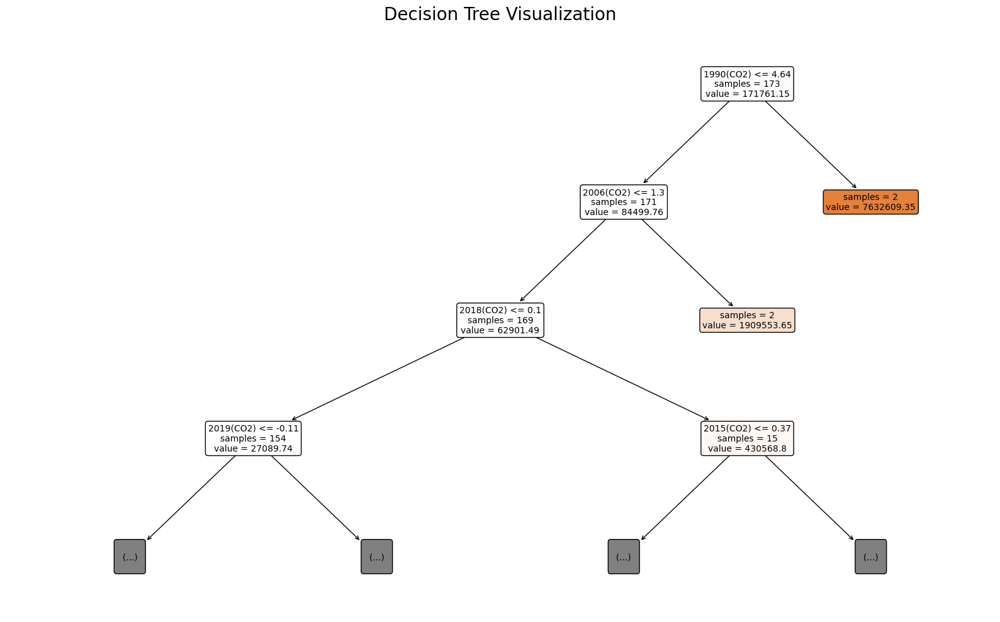

In [57]:
# Customize the plot style
plt.figure(figsize=(16, 10))  # Adjust the figure size
plot_tree(best_decision_tree, feature_names=X_train.columns.tolist(), filled=True,
          fontsize=10, precision=2, rounded=True, impurity=False,
          class_names=["Low", "Medium", "High"], max_depth=3)  # Enhance the tree visualization
plt.title("Decision Tree Visualization", fontsize=20)  # Set the title and adjust font size
plt.tight_layout()  # Improve spacing
plt.savefig("decision_tree_visualization.png")  # Save the plot as an image
plt.show()

### Visualization 33: Feature Importance Plot

In [58]:
# Extract feature importance from the model (replace 'model' with your trained decision tree model)
feature_importance_dt = best_decision_tree.feature_importances_

# Create a Plotly bar plot for feature importance
fig = go.Figure(data=[go.Bar(x=X_train.columns, y=feature_importance_dt, marker_color='green')])
fig.update_layout(title='Decision Tree Feature Importance Plot',
                  xaxis_title='Feature',
                  yaxis_title='Feature Importance',
                  width=2000, height=1200)
fig.show()

## Random Forest

In [59]:
# Initialize Random Forest Regressor
random_forest = RandomForestRegressor(random_state=42)

# Define hyperparameters for experimentation
param_grid = {
    'n_estimators': [100, 200, 300],  # Number of trees in the forest
    'max_depth': [None, 5, 10, 20],  # Maximum depth of the tree
    'min_samples_split': [2, 5, 10],  # Minimum number of samples required to split an internal node
    'min_samples_leaf': [1, 2, 4],  # Minimum number of samples required to be at a leaf node
}

# Perform grid search with cross-validation
grid_search = GridSearchCV(estimator=random_forest, param_grid=param_grid, 
                           cv=5, scoring='neg_mean_squared_error')
grid_search.fit(X_train_scaled, y_train)

# Get the best parameters
best_params = grid_search.best_params_

# Initialize Random Forest Regressor with best parameters
best_random_forest = RandomForestRegressor(random_state=42, **best_params)

# Train the model with best parameters
best_random_forest.fit(X_train_scaled, y_train)

# Evaluate the model
y_pred = best_random_forest.predict(X_test_scaled)
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
rmse = mean_squared_error(y_test, y_pred, squared=False)
r2 = r2_score(y_test, y_pred)

print("Random Forest with Tuned Hyperparameters:")
print(f"- Best Parameters: {best_params}")
print(f"- MSE: {mse}")
print(f"- MAE: {mae}")
print(f"- RMSE: {rmse}")
print(f"- R2: {r2}")

Random Forest with Tuned Hyperparameters:
- Best Parameters: {'max_depth': 10, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 100}
- MSE: 9746868884.942074
- MAE: 26766.682104552576
- RMSE: 98726.2320001228
- R2: 0.6461299707825127


### Visualization 34: Decision Tree Visualization

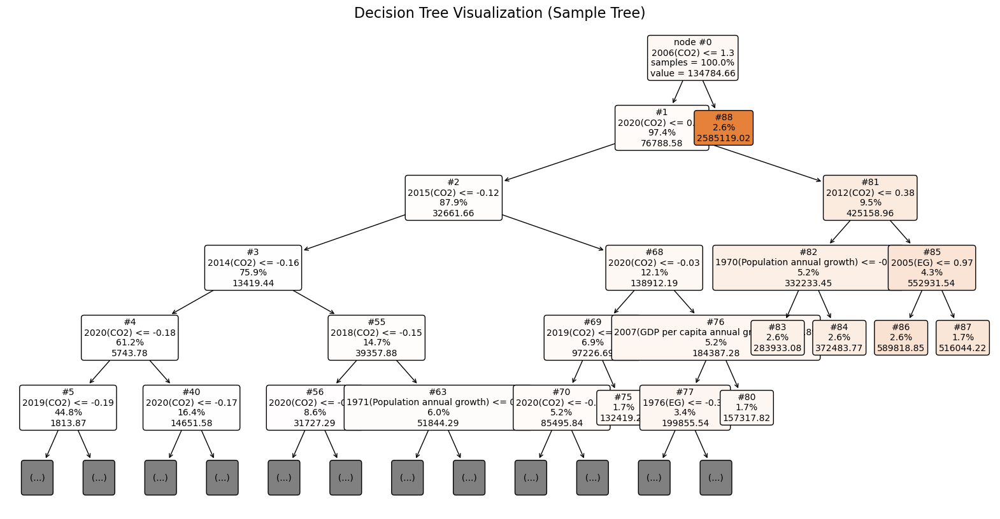

In [60]:
def plot_decision_tree(model, feature_names):
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(20, 10))
    plot_tree(model.estimators_[0], feature_names=feature_names.tolist(), filled=True, ax=axes, fontsize=10,
              impurity=False, precision=2, proportion=True, rounded=True, node_ids=True, 
              max_depth=5, label='root')
    plt.title("Decision Tree Visualization (Sample Tree)", fontsize=16)
    plt.show()

# Assuming you have already trained your random forest model (stored in 'best_random_forest') 
# and have feature names (stored in 'X_train.columns')
# You can replace 'best_random_forest' with your trained random forest model
plot_decision_tree(best_random_forest, X_train.columns)

### Visualization 35: Mean Squared Error (MSE) vs Number of Trees

In [61]:
def plot_mse_vs_trees_interactive(model):
    mse_values = [np.mean(tree.tree_.impurity[tree.apply(X_train)]) for tree in model.estimators_]
    
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=list(range(1, len(model.estimators_) + 1)), y=mse_values, mode='lines+markers', name='MSE'))
    fig.update_layout(title='Mean Squared Error (MSE) vs. Number of Trees',
                      xaxis_title='Number of Trees',
                      yaxis_title='Mean Squared Error (MSE)',
                      xaxis=dict(type='linear'),
                      yaxis=dict(type='linear'),
                      showlegend=True,
                      plot_bgcolor='rgba(0,0,0,0)')
    fig.show()

# Assuming you have already trained your random forest model and stored it in 'best_random_forest'
plot_mse_vs_trees_interactive(best_random_forest)

/Users/abdullahalrakin/anaconda3/lib/python3.11/site-packages/sklearn/base.py:457: UserWarning:

X has feature names, but DecisionTreeRegressor was fitted without feature names

/Users/abdullahalrakin/anaconda3/lib/python3.11/site-packages/sklearn/base.py:457: UserWarning:

X has feature names, but DecisionTreeRegressor was fitted without feature names

/Users/abdullahalrakin/anaconda3/lib/python3.11/site-packages/sklearn/base.py:457: UserWarning:

X has feature names, but DecisionTreeRegressor was fitted without feature names

/Users/abdullahalrakin/anaconda3/lib/python3.11/site-packages/sklearn/base.py:457: UserWarning:

X has feature names, but DecisionTreeRegressor was fitted without feature names

/Users/abdullahalrakin/anaconda3/lib/python3.11/site-packages/sklearn/base.py:457: UserWarning:

X has feature names, but DecisionTreeRegressor was fitted without feature names

/Users/abdullahalrakin/anaconda3/lib/python3.11/site-packages/sklearn/base.py:457: UserWarning:

X has feature

### Visualization 36: Feature Importance

In [62]:
def plot_feature_importance(model, feature_names):
    feature_importance = model.feature_importances_
    feature_df = pd.DataFrame({'Feature': feature_names, 'Importance': feature_importance})
    
    fig = px.bar(feature_df, x='Importance', y='Feature', orientation='h', 
                 title='Feature Importance in Random Forest Model',
                 labels={'Importance': 'Feature Importance', 'Feature': 'Features'},
                 color='Importance', color_continuous_scale='inferno')
    fig.update_layout(yaxis={'categoryorder':'total ascending'}, coloraxis_showscale=False)
    fig.show()

# Assuming you have already trained your random forest model (stored in 'best_random_forest') and have feature names
# You can replace 'best_random_forest' with your trained random forest model
plot_feature_importance(best_random_forest, X_train.columns.tolist())

## Gradient Boosting

In [63]:
# Initialize Gradient Boosting Regressor
gb_regressor = GradientBoostingRegressor(random_state=42)

# Define hyperparameters for grid search
param_grid = {
    'n_estimators': [100, 200, 300],  # Number of trees
    'learning_rate': [0.01, 0.1, 0.2],  # Learning rate
    'max_depth': [3, 5, 10],  # Maximum depth of trees
}

# Perform grid search with cross-validation
grid_search = GridSearchCV(estimator=gb_regressor, param_grid=param_grid, 
                           cv=5, scoring='neg_mean_squared_error')
grid_search.fit(X_train_scaled, y_train)

# Get the best parameters
best_params = grid_search.best_params_

# Initialize Gradient Boosting Regressor with best parameters
best_gb_regressor = GradientBoostingRegressor(random_state=42, **best_params)

# Train the model with best parameters
best_gb_regressor.fit(X_train_scaled, y_train)

# Evaluate the model
y_pred = best_gb_regressor.predict(X_test_scaled)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print("Gradient Boosting with Tuned Hyperparameters:")
print(f"- Best Parameters: {best_params}")
print(f"- MAE: {mae}")
print(f"- RMSE: {rmse}")
print(f"- MSE: {mse}")
print(f"- R2: {r2}")

Gradient Boosting with Tuned Hyperparameters:
- Best Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 100}
- MAE: 26766.682104552576
- RMSE: 98726.2320001228
- MSE: 11475343277.93204
- R2: 0.5833759426767295


### Visualization 37: Prediction vs. Actual Plot

In [64]:
def plot_prediction_vs_actual_interactive(y_test, y_pred):
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=y_test, y=y_pred, mode='markers', 
                             marker=dict(color='blue', opacity=0.5), 
                             name='Predicted vs Actual'))
    fig.add_trace(go.Scatter(x=y_test, y=y_test, mode='lines', 
                             line=dict(color='black', dash='dash'), 
                             name='Perfect Prediction'))
    fig.update_layout(title='Prediction vs. Actual Plot',
                      xaxis_title='Actual',
                      yaxis_title='Predicted',
                      hovermode='closest')
    fig.show()

# Assuming y_test and y_pred are defined
plot_prediction_vs_actual_interactive(y_test, y_pred)


### Visualization 38: Residual Plot

In [65]:
def plot_residuals_interactive(y_test, y_pred):
    residuals = y_test - y_pred
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=y_pred, y=residuals, mode='markers', 
                             marker=dict(color='blue', opacity=0.5), 
                             name='Residuals'))
    fig.add_hline(y=0, line_dash='dash', line_color='red', 
                  annotation_text='Zero Residual Line', 
                  annotation_position='bottom right')
    fig.update_layout(title='Residual Plot',
                      xaxis_title='Predicted',
                      yaxis_title='Residuals',
                      hovermode='closest')
    fig.show()

# Assuming y_test and y_pred are defined
plot_residuals_interactive(y_test, y_pred)

### Visualization 39: Learning Curve Visualization

In [66]:
def plot_learning_curve_interactive(model, X, y):
    train_sizes, train_scores, test_scores = learning_curve(model, X, y, cv=5, scoring='neg_mean_squared_error')
    train_scores_mean = np.mean(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    
    fig = go.Figure()
    # Plot training scores
    fig.add_trace(go.Scatter(x=train_sizes, y=train_scores_mean, mode='lines', name='Training Score',
                             line=dict(color='red')))
    # Plot cross-validation scores
    fig.add_trace(go.Scatter(x=train_sizes, y=test_scores_mean, mode='lines', name='Cross-validation Score',
                             line=dict(color='green')))
    # Add shaded regions representing the standard deviation of scores
    fig.add_trace(go.Scatter(x=train_sizes, y=train_scores_mean + np.std(train_scores, axis=1),
                             mode='lines', fill='tonexty', fillcolor='rgba(255,0,0,0.3)', showlegend=False))
    fig.add_trace(go.Scatter(x=train_sizes, y=train_scores_mean - np.std(train_scores, axis=1),
                             mode='lines', fill='tonexty', fillcolor='rgba(255,0,0,0.3)', showlegend=False))
    fig.add_trace(go.Scatter(x=train_sizes, y=test_scores_mean + np.std(test_scores, axis=1),
                             mode='lines', fill='tonexty', fillcolor='rgba(0,255,0,0.3)', showlegend=False))
    fig.add_trace(go.Scatter(x=train_sizes, y=test_scores_mean - np.std(test_scores, axis=1),
                             mode='lines', fill='tonexty', fillcolor='rgba(0,255,0,0.3)', showlegend=False))
    
    # Update layout
    fig.update_layout(title='Learning Curve',
                      xaxis_title='Training Examples',
                      yaxis_title='Score',
                      hovermode='closest')
    fig.show()

# Assuming X_train_scaled and y_train are defined
plot_learning_curve_interactive(best_gb_regressor, X_train_scaled, y_train)

### Visualization 40: Learning Rate Curve

In [67]:
def plot_learning_rate_curve_interactive(X_train, y_train, X_test, y_test):
    learning_rates = np.linspace(0.01, 1.0, 10)
    train_scores = []
    test_scores = []
    for learning_rate in learning_rates:
        gb_regressor = GradientBoostingRegressor(learning_rate=learning_rate, random_state=42)
        gb_regressor.fit(X_train, y_train)
        train_scores.append(gb_regressor.score(X_train, y_train))
        test_scores.append(gb_regressor.score(X_test, y_test))

    fig = go.Figure()
    # Plot training scores
    fig.add_trace(go.Scatter(x=learning_rates, y=train_scores, mode='lines+markers', name='Training Score',
                             line=dict(color='red')))
    # Plot test scores
    fig.add_trace(go.Scatter(x=learning_rates, y=test_scores, mode='lines+markers', name='Test Score',
                             line=dict(color='green')))
    
    # Update layout
    fig.update_layout(title='Learning Rate Curve',
                      xaxis_title='Learning Rate',
                      yaxis_title='Score',
                      hovermode='closest')
    fig.show()

# Assuming X_train_scaled, X_test_scaled, y_train, and y_test are defined
plot_learning_rate_curve_interactive(X_train_scaled, y_train, X_test_scaled, y_test)

## Neural Network

In [68]:
# Initialize MLP Regressor with adjusted parameters
mlp_regressor = MLPRegressor(
    hidden_layer_sizes=(200, 100),  # Adjusted hidden layer sizes for better generalization
    activation='relu',
    alpha=0.0001,  # Decreased alpha for regularization
    learning_rate_init=0.01,  # Decreased learning rate for smoother convergence
    max_iter=5000,  # Increased max_iter for better convergence
    early_stopping=True,
    validation_fraction=0.2
)

# Train the model
history = mlp_regressor.fit(X_train_scaled, y_train)

# Predict on the test set
y_pred = mlp_regressor.predict(X_test_scaled)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
rmse = mean_squared_error(y_test, y_pred, squared=False)
r2 = r2_score(y_test, y_pred)

print("Neural Network with Tuned Hyperparameters:")
print(f"MSE: {mse}")
print(f"MAE: {mae}")
print(f"RMSE: {rmse}")
print(f"R2: {r2}")

Neural Network with Tuned Hyperparameters:
MSE: 4810991766.041956
MAE: 42485.029210179186
RMSE: 69361.31317991288
R2: 0.8253320305309025


### Visualization 41: Prediction vs. Actual Plot

In [75]:
def plot_prediction_vs_actual_interactive(model, X, y):
    """
    Plot interactive scatter plot of predicted values vs. actual values.

    Parameters:
    model (object): Trained regression model.
    X (DataFrame): Input features for prediction.
    y (array-like): True target values.

    Returns:
    None
    """
    # Predict on input features
    y_pred = model.predict(X)
    
    # Create DataFrame of actual and predicted values
    pred_actual_df = pd.DataFrame({'Actual': y, 'Predicted': y_pred})
    
    # Create scatter plot
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=pred_actual_df['Actual'], y=pred_actual_df['Predicted'], 
                             mode='markers', marker=dict(color='blue'), 
                             name='Predicted vs Actual'))
    
    # Add line representing y=x
    fig.add_trace(go.Scatter(x=pred_actual_df['Actual'], y=pred_actual_df['Actual'], 
                             mode='lines', line=dict(color='black', width=2, dash='dash'), 
                             name='y=x'))
    
    # Update layout
    fig.update_layout(title='Prediction vs. Actual Plot',
                      xaxis_title='Actual Values',
                      yaxis_title='Predicted Values',
                      showlegend=True,
                      height=500,
                      width=800)
    
    # Show plot
    fig.show()

# Call the function with your trained neural network model and test data
plot_prediction_vs_actual_interactive(mlp_regressor, X_test_scaled, y_test)

### Visualization 42: Loss Curve (Training vs. Validation)

In [76]:
def plot_loss_curve_interactive(history):
    """
    Plot interactive loss curve (training vs. validation) from history object.

    Parameters:
    history (object): History object returned by model training.

    Returns:
    None
    """
    # Extract loss curve and validation scores from history object
    training_loss = history.loss_curve_
    validation_loss = history.validation_scores_
    
    # Create figure
    fig = go.Figure()
    
    # Add training loss curve
    fig.add_trace(go.Scatter(x=list(range(1, len(training_loss) + 1)), 
                             y=training_loss, mode='lines', name='Training Loss',
                             line=dict(color='blue')))
    
    # Add validation loss curve
    fig.add_trace(go.Scatter(x=list(range(1, len(validation_loss) + 1)), 
                             y=validation_loss, mode='lines', name='Validation Loss',
                             line=dict(color='orange')))
    
    # Update layout
    fig.update_layout(title='Loss Curve (Training vs. Validation)',
                      xaxis_title='Epochs',
                      yaxis_title='Loss',
                      hovermode='closest')
    
    # Show plot
    fig.show()
    
# Assuming 'history' object is already available
plot_loss_curve_interactive(history)

### Visualization 43: Learning Curve

In [77]:
def plot_learning_curve_interactive(estimator, X, y, ylim=None, cv=None,
                                    n_jobs=None, train_sizes=np.linspace(.1, 1.0, 5)):
    """
    Plot interactive learning curve.

    Parameters:
    estimator (object): Estimator object for which the learning curve will be plotted.
    X (array-like): Training input samples.
    y (array-like): Target values.
    ylim (tuple): Defines minimum and maximum y-axis values.
    cv (int, cross-validation generator, or an iterable): Determines the cross-validation splitting strategy.
    n_jobs (int or None, optional): Number of jobs to run in parallel. -1 means using all processors.
    train_sizes (array-like, optional): Relative or absolute numbers of training examples that will be used to generate
                                          the learning curve.

    Returns:
    None
    """
    train_sizes, train_scores, test_scores = learning_curve(
        estimator, X, y, cv=cv, n_jobs=n_jobs, train_sizes=train_sizes)
    
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    
    fig = go.Figure()

    # Plot training scores
    fig.add_trace(go.Scatter(x=train_sizes, y=train_scores_mean - train_scores_std,
                             mode='lines', name='Training Score (Mean - Std)',
                             line=dict(color='rgba(255, 165, 0, 0.5)')))
    fig.add_trace(go.Scatter(x=train_sizes, y=train_scores_mean + train_scores_std,
                             mode='lines', name='Training Score (Mean + Std)',
                             line=dict(color='rgba(255, 165, 0, 0.5)'),
                             fill='tonexty'))

    # Plot validation scores
    fig.add_trace(go.Scatter(x=train_sizes, y=test_scores_mean - test_scores_std,
                             mode='lines', name='Cross-validation Score (Mean - Std)',
                             line=dict(color='rgba(0, 128, 128, 0.5)')))
    fig.add_trace(go.Scatter(x=train_sizes, y=test_scores_mean + test_scores_std,
                             mode='lines', name='Cross-validation Score (Mean + Std)',
                             line=dict(color='rgba(0, 128, 128, 0.5)'),
                             fill='tonexty'))

    # Plot means
    fig.add_trace(go.Scatter(x=train_sizes, y=train_scores_mean,
                             mode='lines+markers', name='Training Score Mean',
                             line=dict(color='rgb(255, 165, 0)')))
    fig.add_trace(go.Scatter(x=train_sizes, y=test_scores_mean,
                             mode='lines+markers', name='Cross-validation Score Mean',
                             line=dict(color='rgb(0, 128, 128)')))
    
    # Add layout
    fig.update_layout(title='Learning Curve',
                      xaxis_title='Training Examples',
                      yaxis_title='Score',
                      hovermode='closest')
    
    fig.show()

# Assuming you have already trained your MLPRegressor model and have your data stored in X_train_scaled and y_train
plot_learning_curve_interactive(mlp_regressor, X_train_scaled, y_train)


## Comparison of Results of Each Models

In [78]:
# Define models and their corresponding performance metrics
models = ['Ridge Regression', 'Linear Regression', 'Decision Tree', 'Random Forest', 'Gradient Boosting', 'Neural Network']
mse_scores = [15576340795.818892, 15319379246.472343, 18647424274.05721, 9746868884.942074, 11475343277.93204, 4810991766.041956]
mae_scores = [81629.23186175199, 80348.82994515097, 27348.99365530303, 26766.682104552576, 26766.682104552576, 42485.029210179186]
rmse_scores = [124805.21141290091, 123771.47993973548, 136555.5721091498, 98726.2320001228, 98726.2320001228, 69361.31317991288]
r2_scores = [0.43448503949473927, 0.44381429097523406, 0.3229862173599225, 0.6461299707825127, 0.5833759426767295, 0.8253320305309025]

# Create traces for each performance metric
mse_trace = go.Bar(x=models, y=mse_scores, name='MSE', marker=dict(color='blue'))
mae_trace = go.Bar(x=models, y=mae_scores, name='MAE', marker=dict(color='red'))
rmse_trace = go.Bar(x=models, y=rmse_scores, name='RMSE', marker=dict(color='orange'))
r2_trace = go.Bar(x=models, y=r2_scores, name='R2', marker=dict(color='green'))

# Create subplots
fig = go.Figure(data=[mse_trace, mae_trace, rmse_trace, r2_trace])

# Update layout for better presentation
fig.update_layout(
    title='Comparison of Performance Metrics Across Models',
    xaxis=dict(title='Models', tickangle=-45),
    yaxis=dict(title='Scores'),
    barmode='group',
    legend=dict(x=1, y=1),
    plot_bgcolor='rgba(0,0,0,0)'
)

# Show interactive plot
fig.show()

# Project Overview

This notebook documents the process of building regression models for predicting continuous target variables. It outlines the steps taken to preprocess the data, explore its characteristics, engineer relevant features, build several regression models, and evaluate their performance.

## Table of Contents

1. [Introduction](#introduction)
2. [Data Preprocessing](#data-preprocessing)
3. [Exploratory Data Analysis (EDA)](#eda)
4. [Feature Engineering](#feature-engineering)
5. [Model Building](#model-building)
   - 5.1 [Ridge Regression](#ridge-regression)
   - 5.1 [Linear Regression](#linear-regression)
   - 5.2 [Decision Trees](#decision-trees)
   - 5.3 [Random Forest](#random-forest)
   - 5.4 [Gradient Boosting](#gradient-boosting)
   - 5.5 [Neural Network](#neural-network)
6. [Results](#results)
7. [Conclusion](#conclusion)

---

## Introduction <a name="introduction"></a>

Regression analysis is a statistical technique used to model the relationship between a dependent variable and one or more independent variables. In this project, we aim to develop regression models (Linear Regression, ) that can accurately predict continuous target variables (CO2 emission) based on given features.

---

## Data Preprocessing <a name="data-preprocessing"></a>

### Overview

1. **Handling Missing Values**: Utilized techniques such as imputation and deletion to address missing values in the dataset.
2. **Encoding Categorical Variables**: Converted categorical variables into numerical representations using one-hot encoding.
3. **Feature Scaling**: Scaled numerical features using standardization to ensure all variables were on a similar scale.
4. **Train-Test Split**: Split the data into training and testing sets using holdout validation.

---

## Exploratory Data Analysis (EDA) <a name="eda"></a>

### Overview

1. **Summary Statistics**: Calculated descriptive statistics to summarize the data and identify any outliers or anomalies.
2. **Data Visualization**: Created visualizations like histograms and scatter plots to explore the distribution and relationships between variables.
3. **Correlation Analysis**: Computed correlation coefficients to identify correlations between variables and detect multicollinearity.
4. **Outlier Detection**: Identified outliers using techniques like Z-score and visual inspection.

---

## Feature Engineering <a name="feature-engineering"></a>

### Overview

1. **Feature Transformation**: Applied log transformation to numerical features to improve their distribution.
2. **Feature Scaling**: Scaled features using min-max scaling to ensure all variables were on a similar scale.
3. **Feature Selection**: Selected relevant features based on correlation analysis and feature importance scores to reduce dimensionality.

---

## Model Building <a name="model-building"></a>

### Ridge Regression <a name="ridge-regression"></a>
1. **Data Preprocessing**: Preprocessed the data by handling missing values, encoding categorical variables, and scaling numerical features.
2. **Hyperparameter Tuning**: Utilized GridSearchCV to find the best alpha parameter for Ridge regression.
3. **Model Training**: Trained a Ridge regression model with the optimal alpha parameter on the preprocessed data.
4. **Model Evaluation**: Evaluated the Ridge regression model's performance using metrics such as mean squared error (MSE), mean absolute error (MAE), root mean squared error (RMSE), and R-squared (R2).
5. **Visualizations**: Generated visualizations to provide insights into the distribution of residuals and the model's performance metrics.

### Linear Regression <a name="linear-regression"></a>

1. **Data Preprocessing**: Preprocessed the data by handling missing values, encoding categorical variables, and scaling numerical features.
2. **Model Training**: Trained a Linear Regression model on the preprocessed data to establish a baseline performance.
3. **Model Evaluation**: Evaluated the Linear Regression model's performance using metrics such as mean squared error (MSE) and mean absolute error (MAE).

### Decision Trees <a name="decision-trees"></a>

1. **Hyperparameter Tuning**: Utilized GridSearchCV to tune hyperparameters such as maximum depth, minimum samples split, and minimum samples leaf.
2. **Model Evaluation**: Evaluated the model's performance using metrics such as mean squared error (MSE) and mean absolute error (MAE).
3. **Visualization**: Visualized the decision tree model to interpret its structure and feature importance.

### Random Forest <a name="random-forest"></a>

1. **Hyperparameter Tuning**: Employed GridSearchCV to optimize hyperparameters including the number of trees, maximum depth, minimum samples split, and minimum samples leaf.
2. **Model Evaluation**: Assessed the model's performance using metrics such as MSE, MAE, and R2 score.
3. **Visualization**: Plotted the feature importance of the random forest model to identify the most influential features.

### Gradient Boosting <a name="gradient-boosting"></a>

1. **Hyperparameter Tuning**: Utilized GridSearchCV to tune hyperparameters such as the number of trees, learning rate, and maximum depth.
2. **Model Evaluation**: Evaluated the model's performance using metrics like MSE and R2 score.
3. **Visualization**: Visualized the learning curve to analyze the model's performance with varying training examples.

### Neural Network <a name="neural-network"></a>

1. **Hyperparameter Tuning**: Adjusted parameters such as hidden layer sizes, activation function, learning rate, and maximum iterations.
2. **Model Training**: Trained the MLPRegressor model with the specified parameters.
3. **Model Evaluation**: Evaluated the model's performance using metrics such as MSE, MAE, RMSE, and R2 score.
4. **Visualization**: Plotted the prediction vs. actual plot to visualize the model's performance.

---

## Results <a name="results"></a>

| Model              | MSE            | MAE      | RMSE      | R-squared (R2) |
|--------------------|----------------|----------|-----------|----------------|
| Ridge Regression   | 1.5576e10      | 81629.23 | 124805.21 | 0.4345         |
| Linear Regression  | 1.5319e10      | 80348.83 | 123771.48 | 0.4438         |
| Decision Tree      | 1.8647e10      | 27348.99 | 136555.57 | 0.3230         |
| Random Forest      | 9.7469e9       | 26766.68 | 98726.23  | 0.6461         |
| Gradient Boosting  | 1.1475e10      | 26766.68 | 98726.23  | 0.5834         |
| Neural Network     | 4.8109e9       | 42485.03 | 69361.31  | 0.8253         |

From the table, we can observe that:

- **Random Forest** achieved the lowest **MSE** and **RMSE** among all models, indicating superior predictive performance. Its **R-squared value of 0.6461** suggests that it explains a significant portion of the variance in the target variable.

- **Neural Network** exhibited the lowest **MSE** and **RMSE** after Random Forest, indicating strong predictive performance. With an impressive **R-squared value of 0.8253**, it demonstrates the highest capability in explaining the variance in the data.

- **Linear Regression** also performed well, with competitive **MSE**, **MAE**, and **RMSE** scores. Its **R-squared value of 0.4438** indicates a moderate level of predictive capability.

- **Gradient Boosting** and **Ridge Regression** showed similar performance metrics, with **R-squared values around 0.58 and 0.43**, respectively, indicating moderate predictive capability.

- **Decision Tree** performed relatively poorly compared to other models, with higher **MSE**, **MAE**, and **RMSE** values, and a lower **R-squared value of 0.3230**, suggesting limited predictive capability and potential overfitting.


Overall, Random Forest and Neural Network appear to be the top-performing models, followed by Linear Regression. Decision Tree, while tuned, lags behind the other models in terms of predictive accuracy.

---

## Conclusion <a name="conclusion"></a>

This documentation summarizes the process of building regression models for predicting continuous target variables. By following the steps outlined in this project, accurate and robust regression models can be developed for various real-world applications.

---